# Image Sharpening using Edge-Preserving Decompositions

In [2]:
import cv2
import numpy as np

from matplotlib import pyplot as plt

### Base Image Display

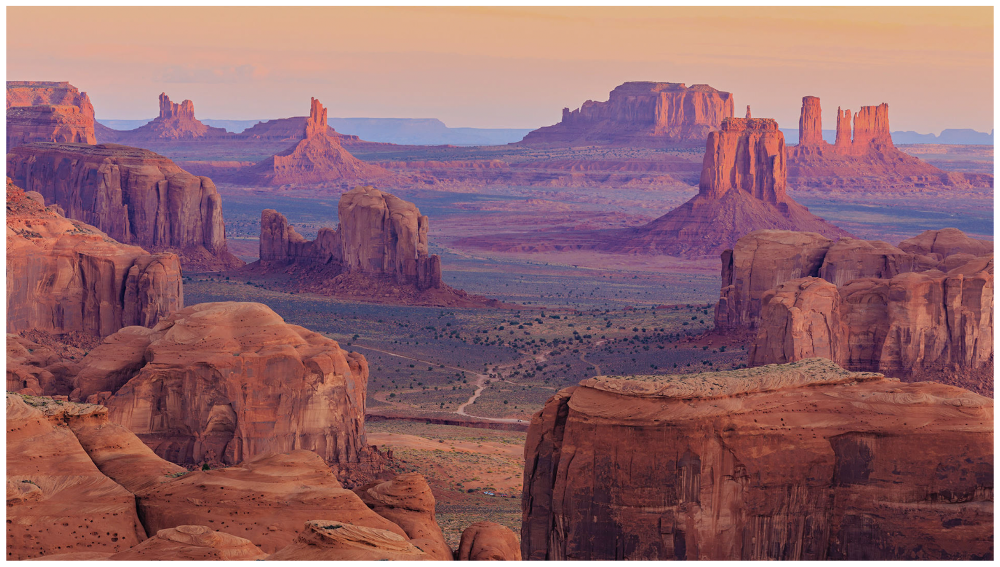

In [3]:
base_image = cv2.cvtColor(cv2.imread("images/hunts-mesa.jpg"), cv2.COLOR_BGR2RGB) / 255.0

plt.figure(figsize=(20, 20))
plt.imshow(base_image)
plt.axis("off")
plt.show()

### Naive Approach - Laplacian Filter

In [4]:
def imsharp_laplacian(input_image, filter_size, filter_std):
    
    # Apply Gaussian blur to input image
    gaussian_image = cv2.GaussianBlur(input_image, (filter_size, filter_size), filter_std)
    
    # Take difference between input image and Gaussian to get Laplacian
    laplacian_image = input_image - gaussian_image
    
    # Add Laplacian to input image
    output_image = input_image + laplacian_image
    
    return output_image.clip(0, 1)

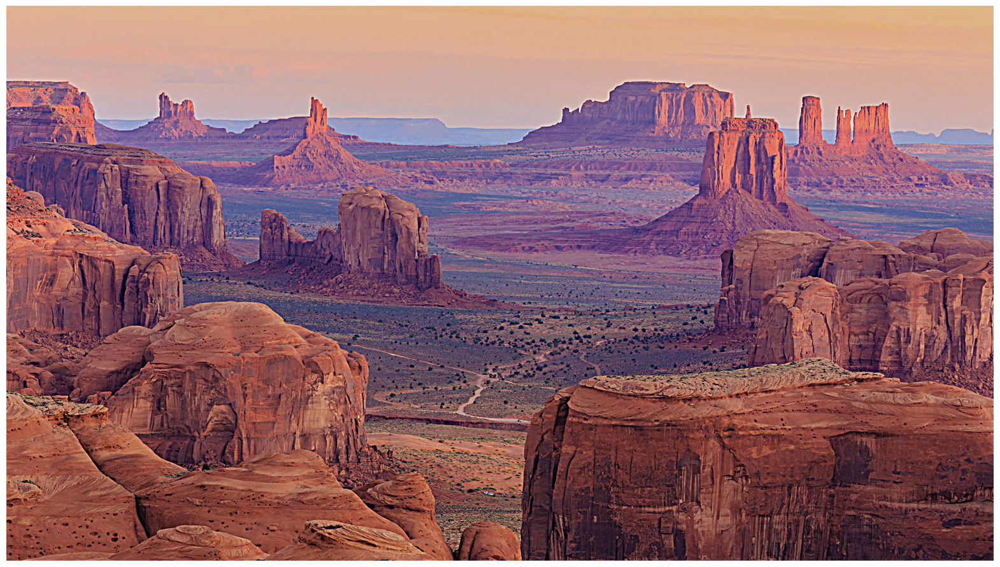

In [5]:
output_laplacian = imsharp_laplacian(base_image, 15, 5)

plt.figure(figsize=(20, 20))
plt.imshow(output_laplacian)
plt.axis("off")
plt.show()

Compared to the original image, the Laplacian filter has a very strong edge-augmenting effect. However, the resulting image seems noisy and unnatural.

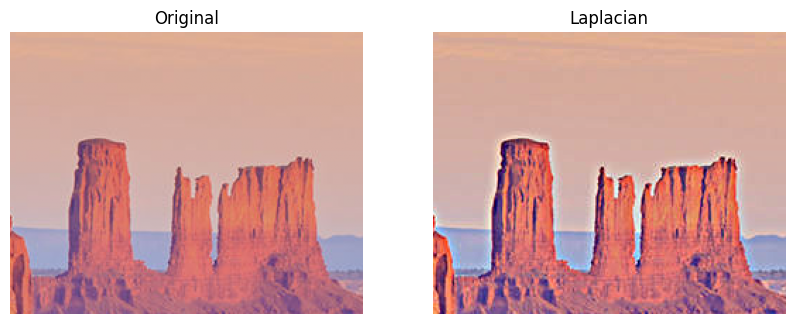

In [9]:
fig, ax = plt.subplots(1, 2, figsize=(10, 10))

ax[0].imshow(base_image[100:300, 1500:1750, :])
ax[0].set_title("Original")
ax[0].axis("off")

ax[1].imshow(output_laplacian[100:300, 1500:1750, :])
ax[1].set_title("Laplacian")
ax[1].axis("off")

plt.show()

Here, we can observe halos around the edges created by the Laplacian filter.

### Bilateral Filter

In [18]:
def imsharp_bilateral(input_image):
    
    # Apply bilateral filter to input image
    bilateral_image = cv2.bilateralFilter(input_image.astype(np.float32), d=9, sigmaColor=75, sigmaSpace=75)
    
    # Take difference between input image and bilateral to get sharpening mask
    sharp_mask = input_image - bilateral_image
    
    # Add sharpening mask to input image
    output_image = input_image + sharp_mask
    
    return output_image.clip(0, 1)

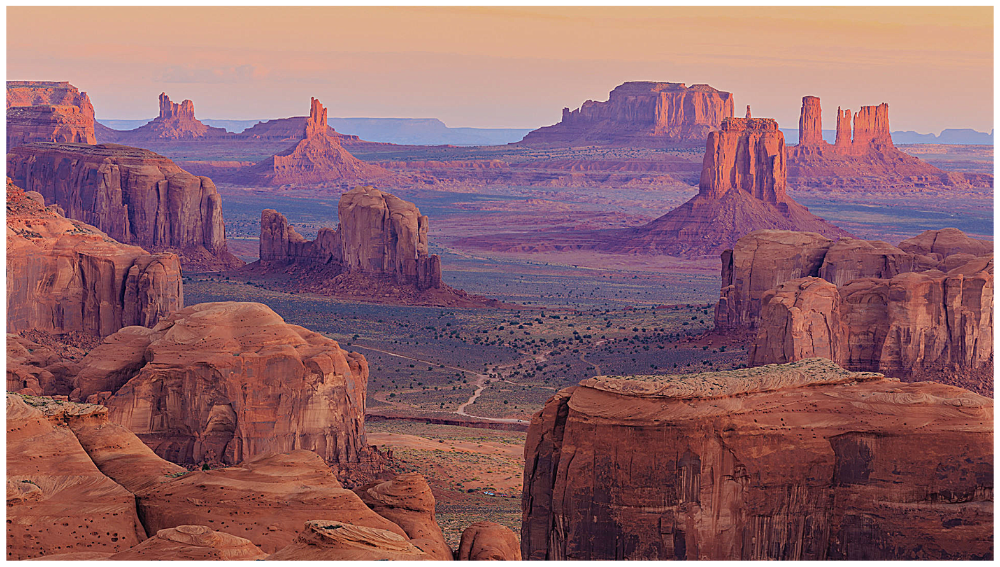

In [19]:
output_bilateral = imsharp_bilateral(base_image)

plt.figure(figsize=(20, 20))
plt.imshow(output_bilateral)
plt.axis("off")
plt.show()